# Lexical norms from Lancaster Sensorimotor Norms
Single predictor models using [Lancaster Sensorimotor Norms](https://www.lancaster.ac.uk/psychology/lsnorms).

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from tools.create import create_single_models
from tools.base import (dump_collection, load_collection, 
                        flatten_collection, compute_metrics,
                        _extract_regressors)
from tools.viz import (plot_regressor, plot_regressor,
                       plot_metrics, plot_contrast_by_dataset, plot_contrast_by_analysis,
                       plot_analysis_grid)
from pyns import Neuroscout
import numpy as np
from matplotlib import pyplot as plt
from pathlib import Path
%matplotlib inline

Set up API by importing credentials as environment variables.

In [3]:
api = Neuroscout()

## Define predictors and confounds

In [4]:
predictors = ['lancastersensorimotornorms_Visual.mean', 'lancastersensorimotornorms_Auditory.mean',
             'lancastersensorimotornorms_Olfactory.mean', 'lancastersensorimotornorms_Haptic.mean',
             'lancastersensorimotornorms_Gustatory.mean', 'lancastersensorimotornorms_Interoceptive.mean',
             'lancastersensorimotornorms_Foot_leg.mean', 'lancastersensorimotornorms_Hand_arm.mean',
             'lancastersensorimotornorms_Head.mean', 'lancastersensorimotornorms_Mouth.mean',
             'lancastersensorimotornorms_Torso.mean']

In [5]:
confounds = ['a_comp_cor_00', 'a_comp_cor_01', 'a_comp_cor_02', 'a_comp_cor_03', 'a_comp_cor_04', 'a_comp_cor_05', 'trans_x', 'trans_y', 'trans_z', 'rot_x', 'rot_y', 'rot_z']

In [6]:
control = ['speech']

## Create single predictor models

In [7]:
transformations = [{"Name": "Scale", 
                    "Demean": True, 
                    "Rescale": True,
                    "ReplaceNA": "after", 
                    "Input": [p]} for p in predictors]

In [8]:
single_models = create_single_models(predictors, confounds, control=control,
                                     transformations=transformations)

In [26]:
filename = Path('models') / 'lexical_sensorimotor_norms.json'

In [30]:
dump_collection(single_models, filename)

In [27]:
single_models = load_collection(filename)

## Generate reports

In [10]:
for (pred, dataset, task), model in flatten_collection(single_models):
    model.generate_report(run_id=model.runs[0])

In [11]:
for p in predictors:
    single_models[p]['Budapest']['movie'].plot_report()

## Inspect regressors

In [12]:
df = _extract_regressors(single_models)

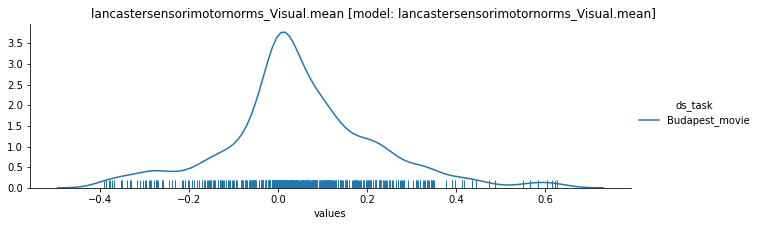

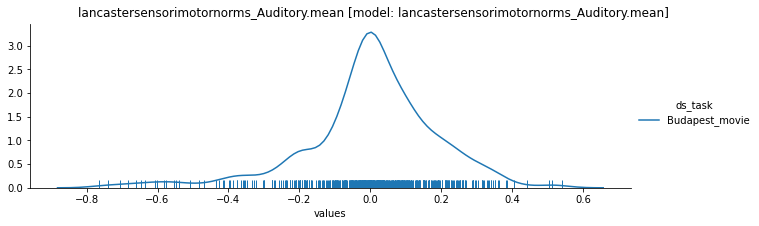

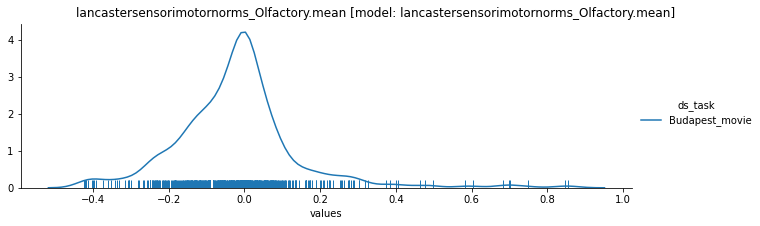

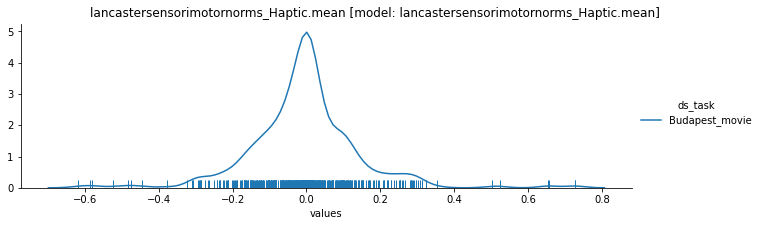

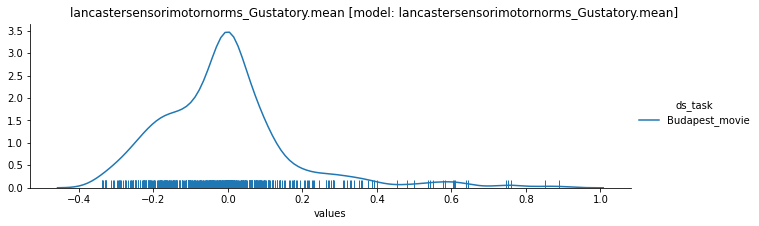

...

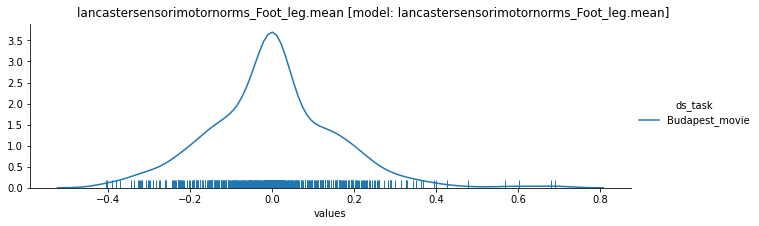

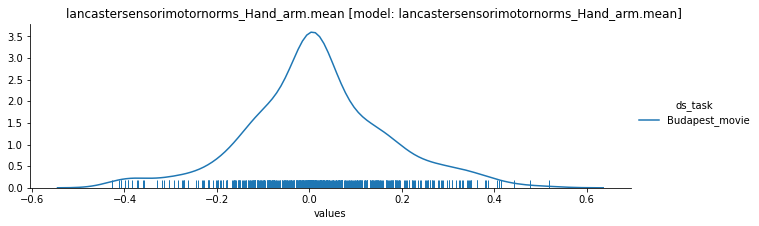

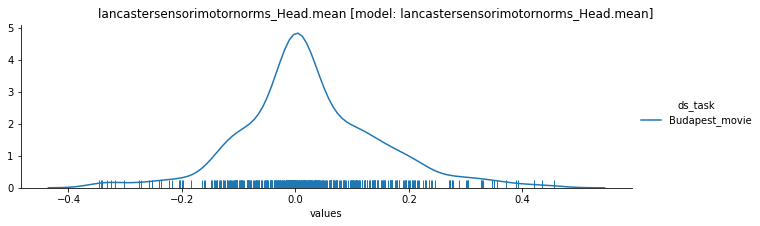

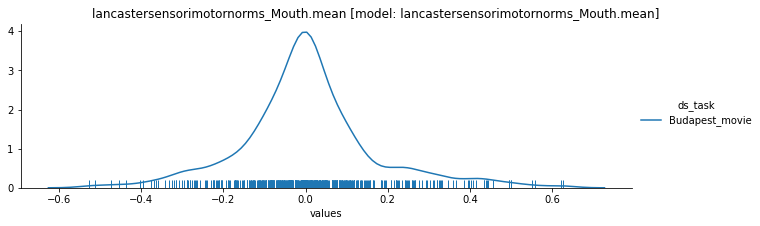

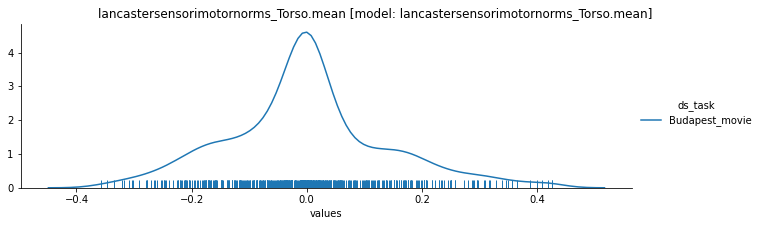

In [13]:
plot_regressor('distribution', df=df, split_by='hue', color=None, aspect=3, hist=None, rug=True)

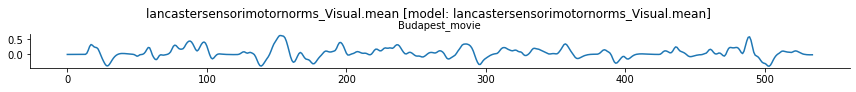

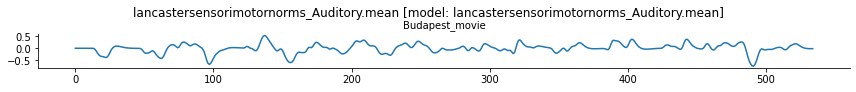

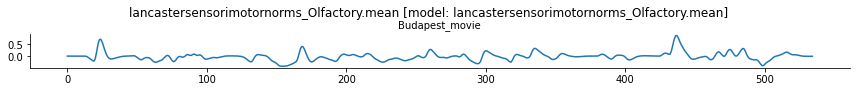

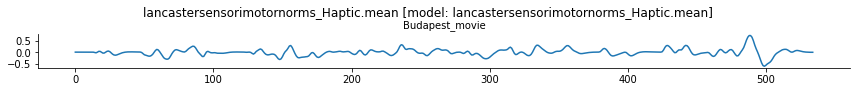

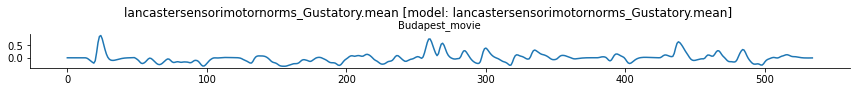

...

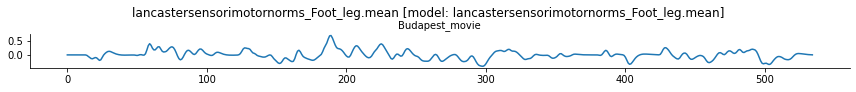

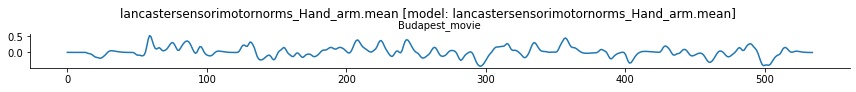

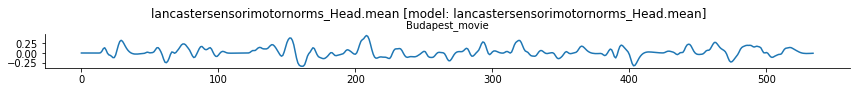

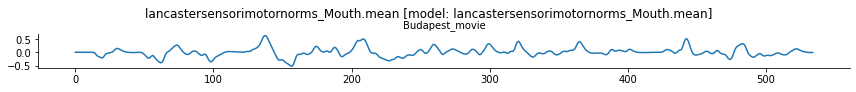

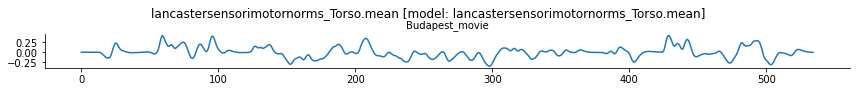

In [14]:
plot_regressor('timeseries', df=df, split_by='row', height=1.2, aspect=10)

In [15]:
agg_df = compute_metrics(df=df, aggfunc=[np.mean, np.std, np.var])

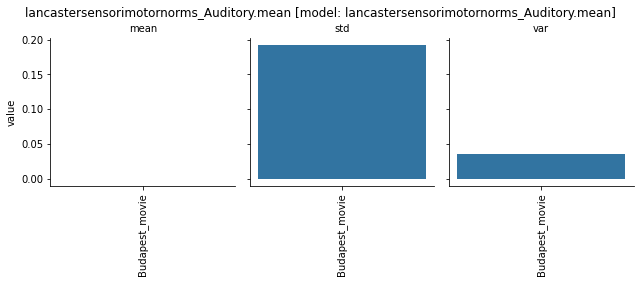

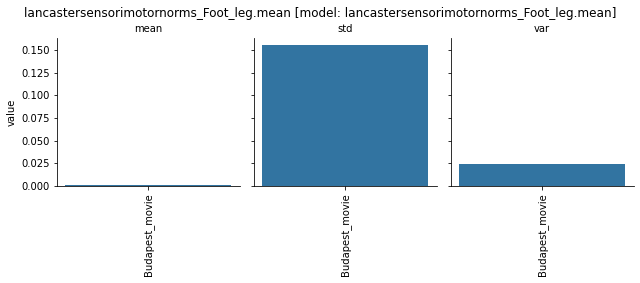

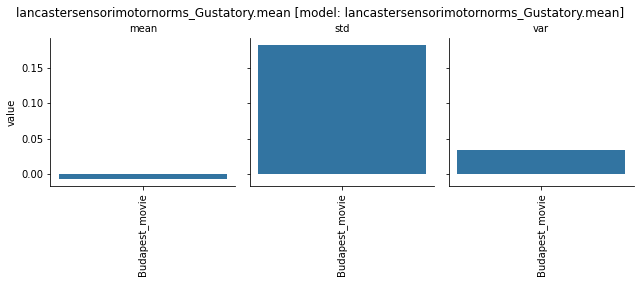

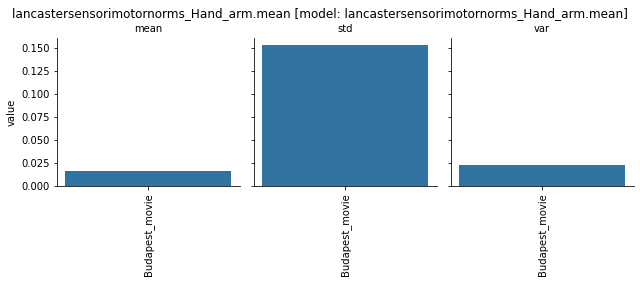

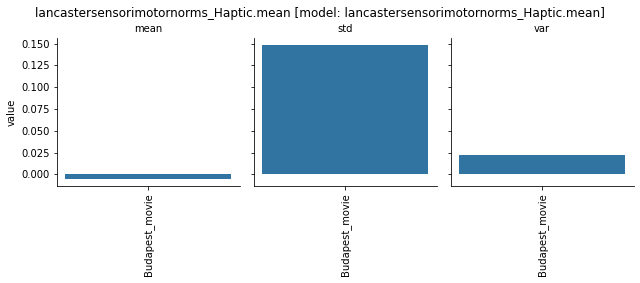

...

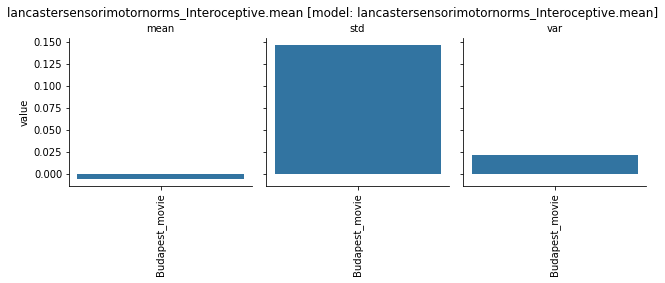

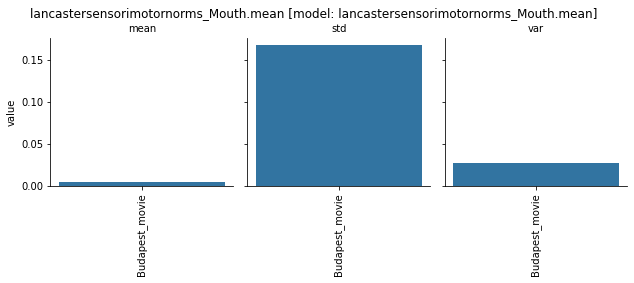

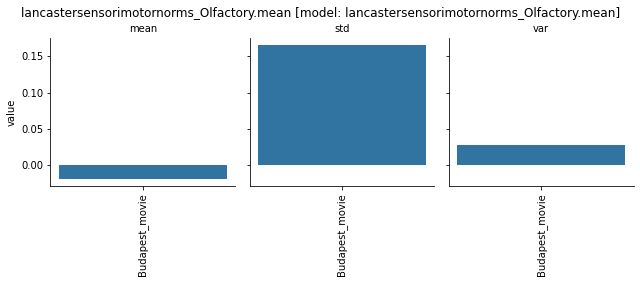

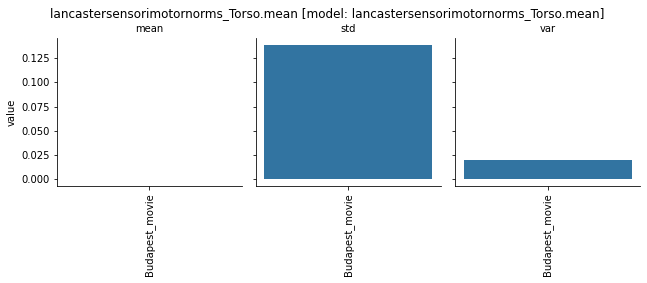

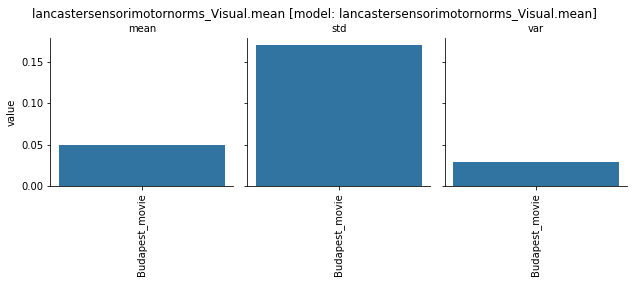

In [16]:
plot_metrics(agg_df, metrics=['mean', 'std', 'var'],
             sns_function='barplot', height=3, aspect=1)

## Compile models

In [32]:
for (pred, dataset, task), model in flatten_collection(single_models):
    if model.get_status()['status'] == 'DRAFT':
        model.private = False
        model.push()
        model.compile()
    else:
        print(f'{pred} {model.status} for {dataset}')

lancastersensorimotornorms_Auditory.mean PASSED for Budapest
lancastersensorimotornorms_Auditory.mean PASSED for HealthyBrainNetwork
lancastersensorimotornorms_Auditory.mean PASSED for LearningTemporalStructure
lancastersensorimotornorms_Auditory.mean PASSED for Life
lancastersensorimotornorms_Auditory.mean PASSED for ParanoiaStory
lancastersensorimotornorms_Auditory.mean PASSED for Raiders
lancastersensorimotornorms_Auditory.mean PASSED for SchematicNarrative
lancastersensorimotornorms_Auditory.mean PASSED for Sherlock
lancastersensorimotornorms_Auditory.mean PASSED for SherlockMerlin
lancastersensorimotornorms_Auditory.mean PASSED for SherlockMerlin
lancastersensorimotornorms_Foot_leg.mean PASSED for Budapest
lancastersensorimotornorms_Foot_leg.mean PASSED for HealthyBrainNetwork
lancastersensorimotornorms_Foot_leg.mean PASSED for LearningTemporalStructure
lancastersensorimotornorms_Foot_leg.mean PASSED for Life
lancastersensorimotornorms_Foot_leg.mean PASSED for ParanoiaStory
lancas

In [31]:
' '.join([a[1].hash_id for a in flatten_collection(single_models)])

'Ma4P1 M8Lry wQDrk wOVKP MXmXD A1GYY AVr1k Abn5Z MnP5g wWVO5 M4jXg M34X8 wl85e MDzp4 wQoez 9Bb77 AYXYb w0vVN wK375 Aobla 97pWO wgjXY Aop5J wlyGp AxkKD A6mPp MPK73 wJJ7p M34Xz AYXYr A251p Mzqrj AxBl6 AVrxa A1G16 M8LG3 AdpVB wOVPd MXmPK AbndV 9L2lz MNW0Z wK2B7 AZyB2 MvbQb 9eK5k M5Q0P Mmvq3 Mp8xb wyDod MNQJl wWVJr wJ3Yb AqbYb MaqV4 MGb4l 9EW70 wjvqP 9Lq4p 97vZe wkV2y MDzpo A6oKd wK37j Aoblm w0vVD wQoel A6mPQ wlyGX AxkKb M55Px M4nmG M37DP M5Qm6 9eKb6 MNW4N A2YmL AZy01 MvbK7 Mmvlx wjN40 MGbx3 w0g33 wjv5X 9LqDV Maq5J Aqb5O 97voB wkK53 M4nQz 9eya7 wyDz0 AYybj MPKvE A6m4Q wgjWR MR2lg wly6X Axkrb wJJ4m AqQm8 9BbWn MD1Gm w0v3D wK3Bj wQorl MDzGo Aob5m Ar65Q MzqJ5'

## Results

In [29]:
flat_models = flatten_collection(single_models)

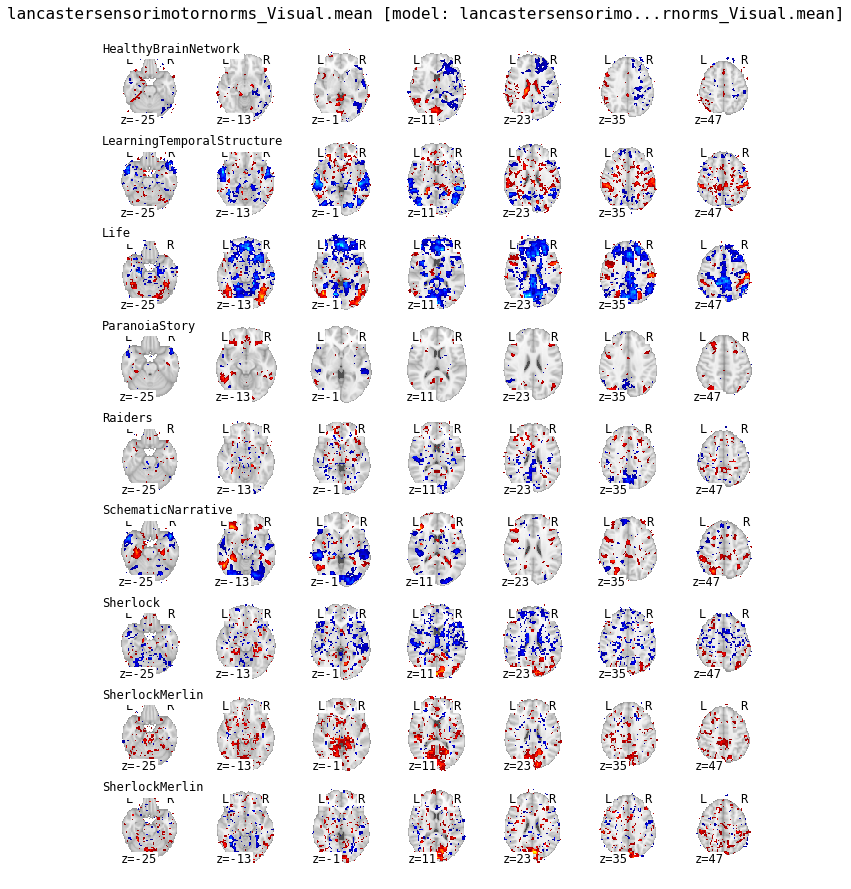

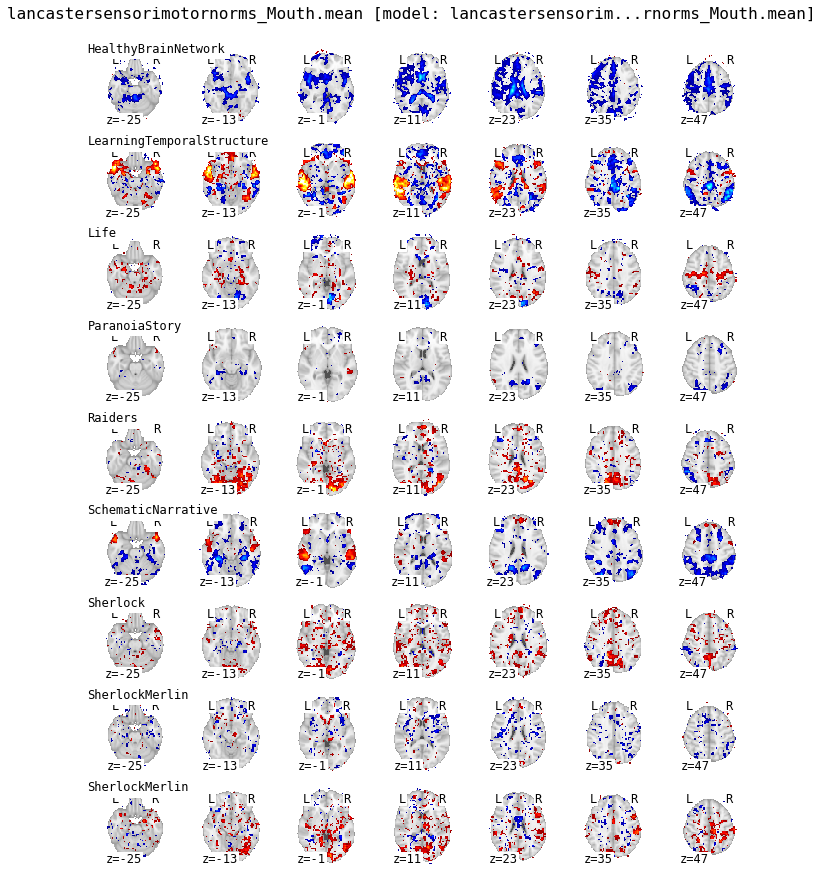

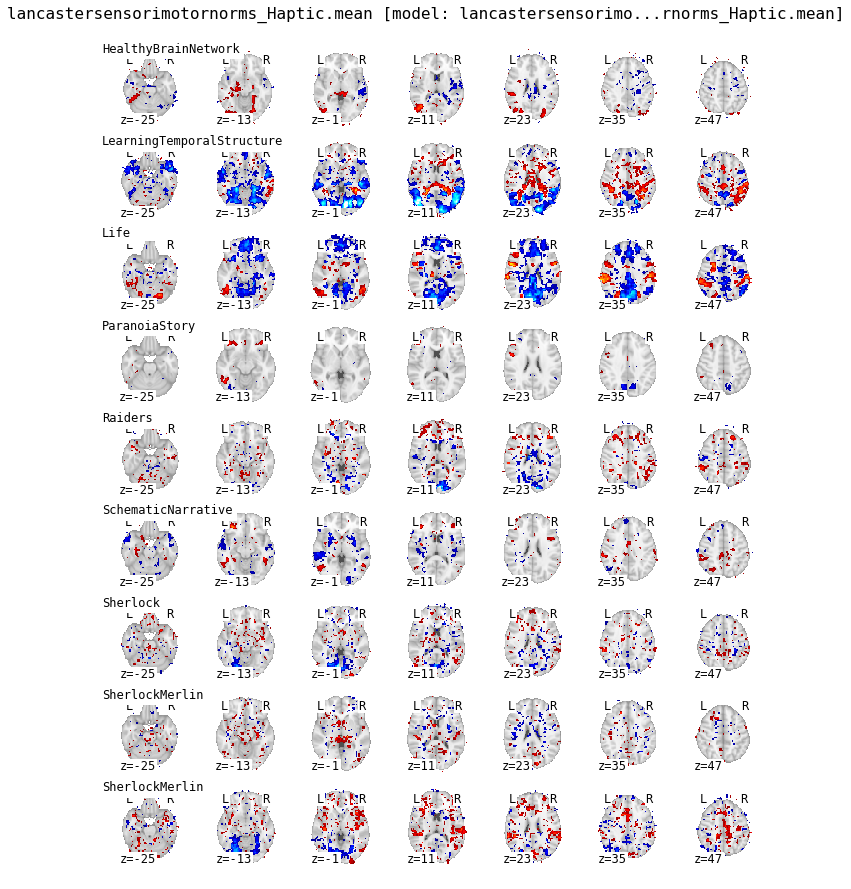

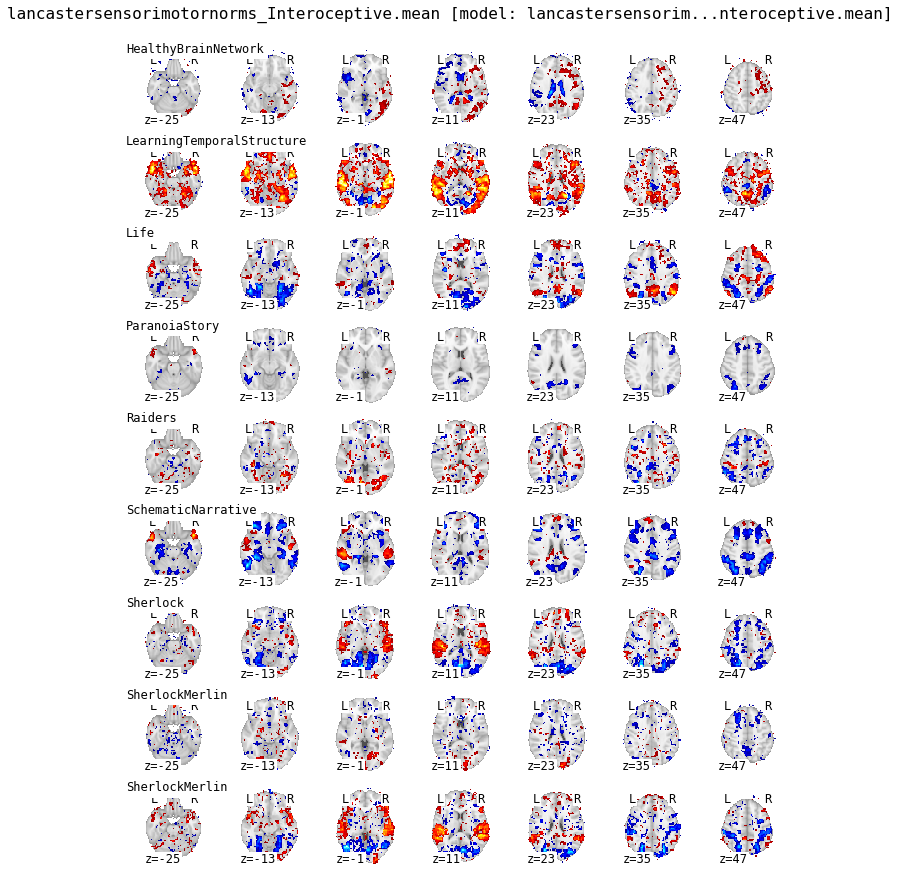

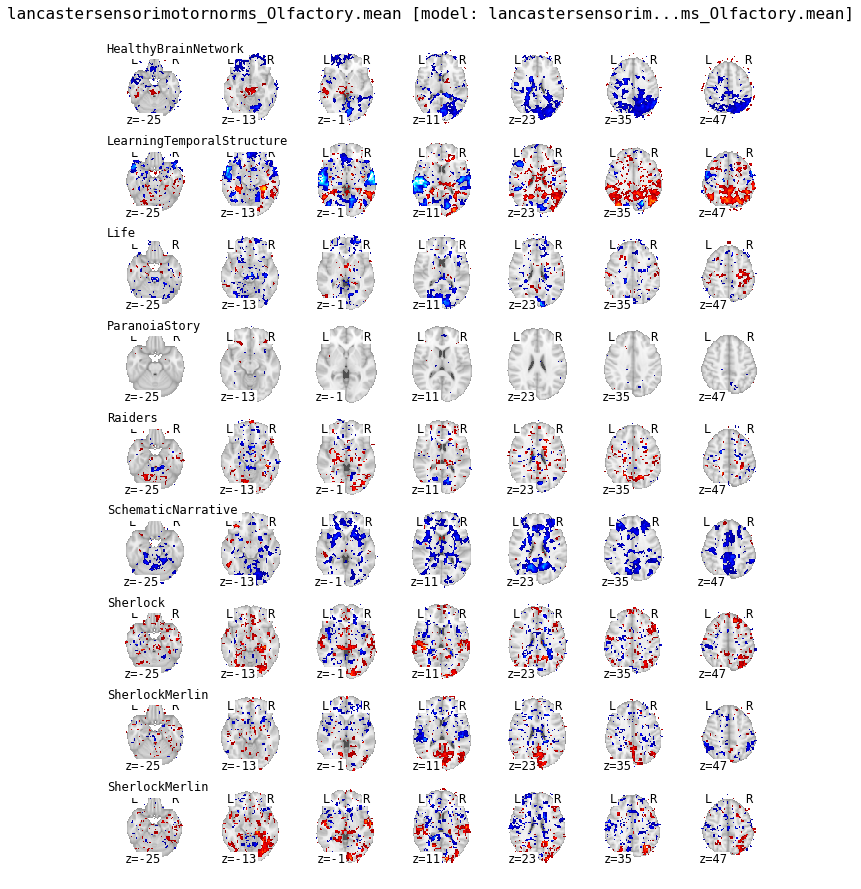

...

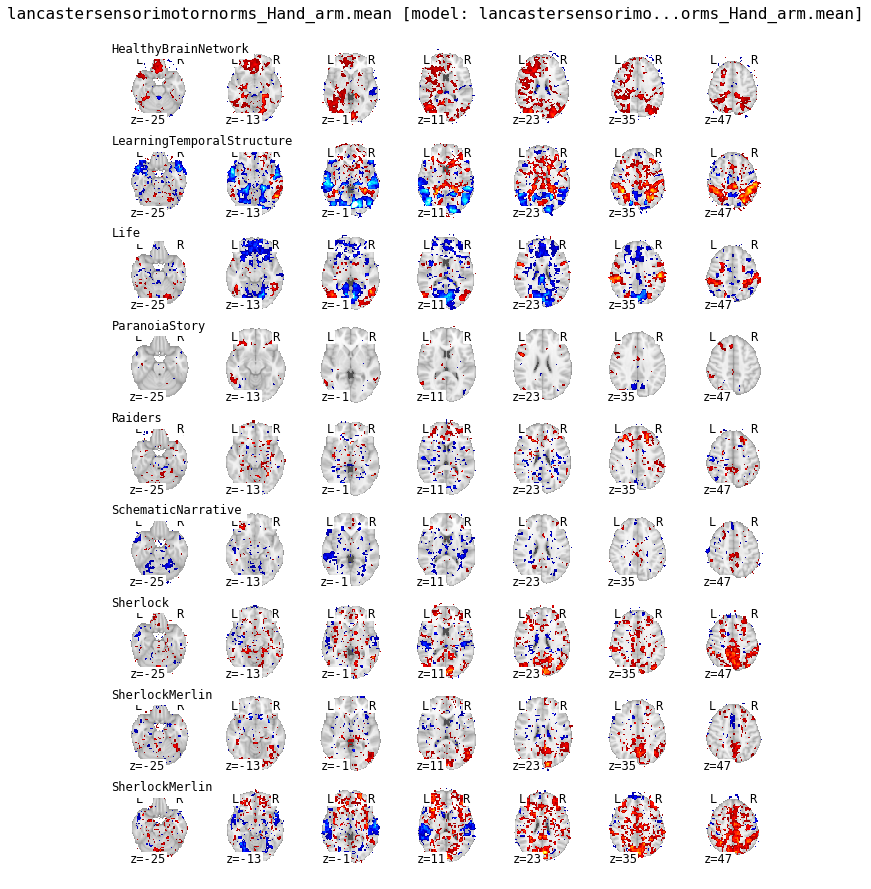

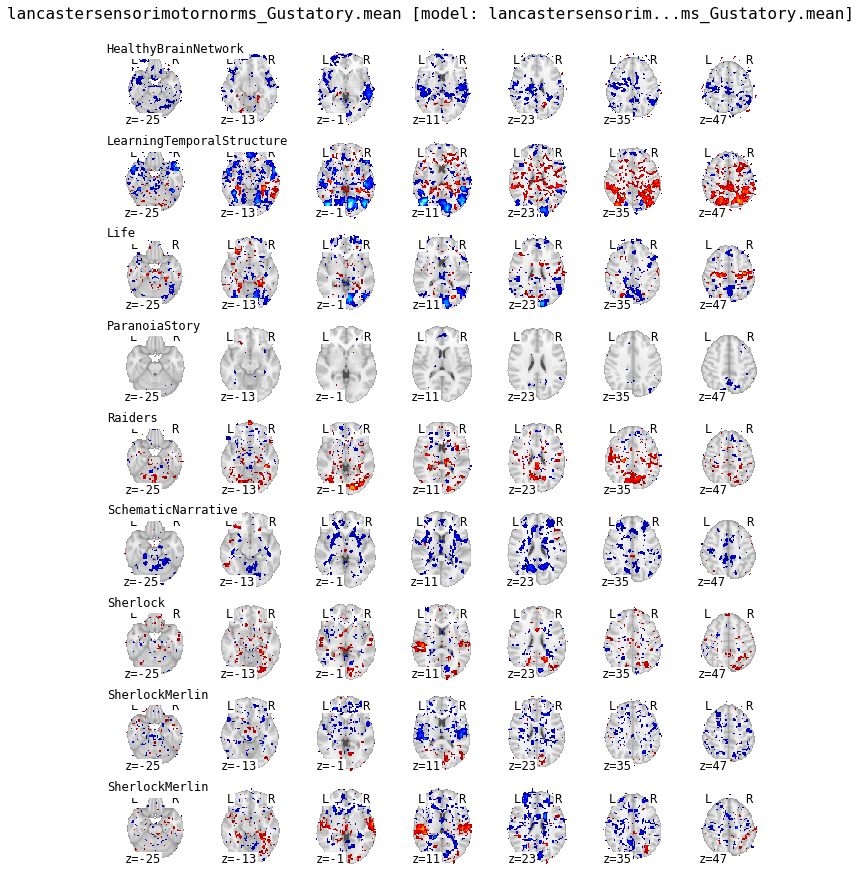

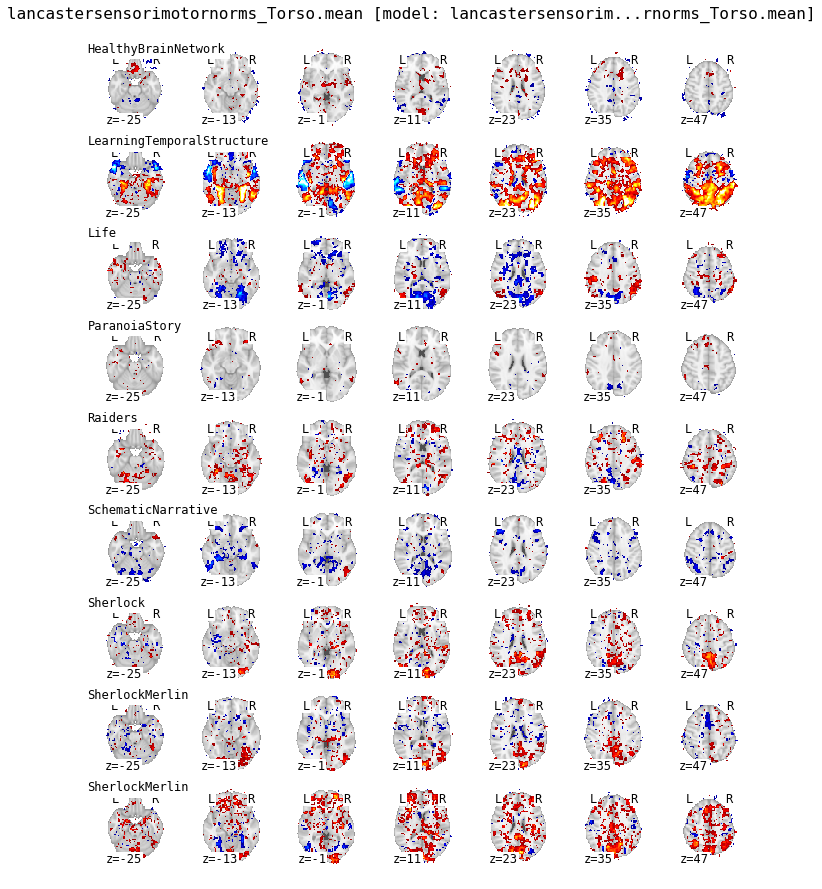

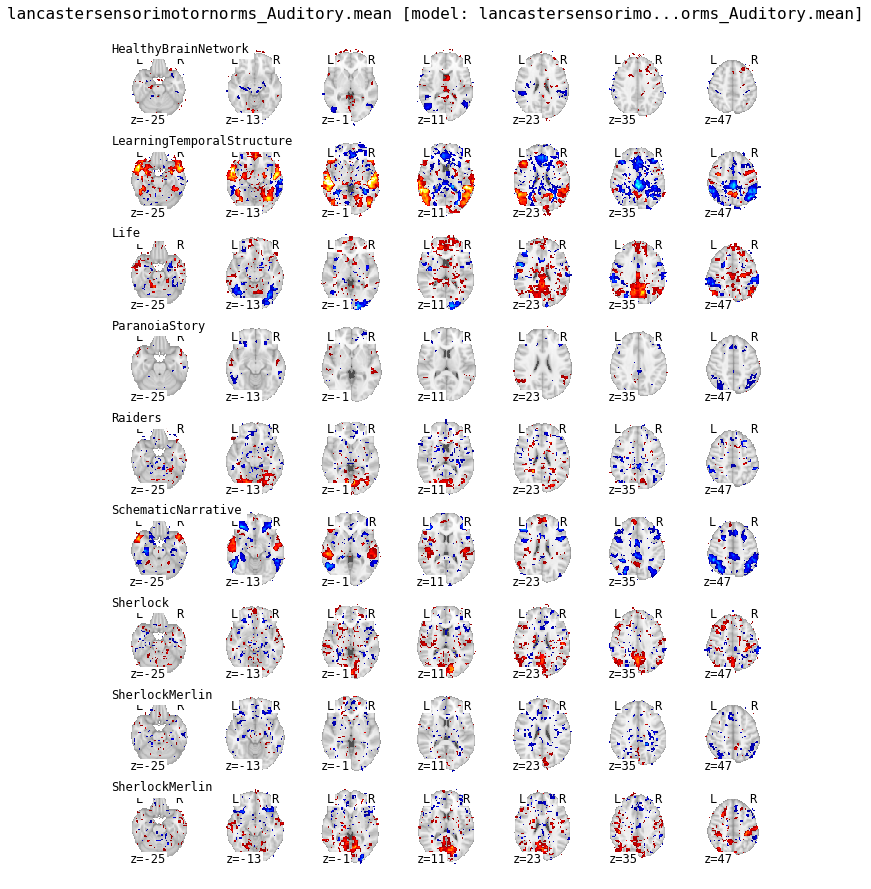

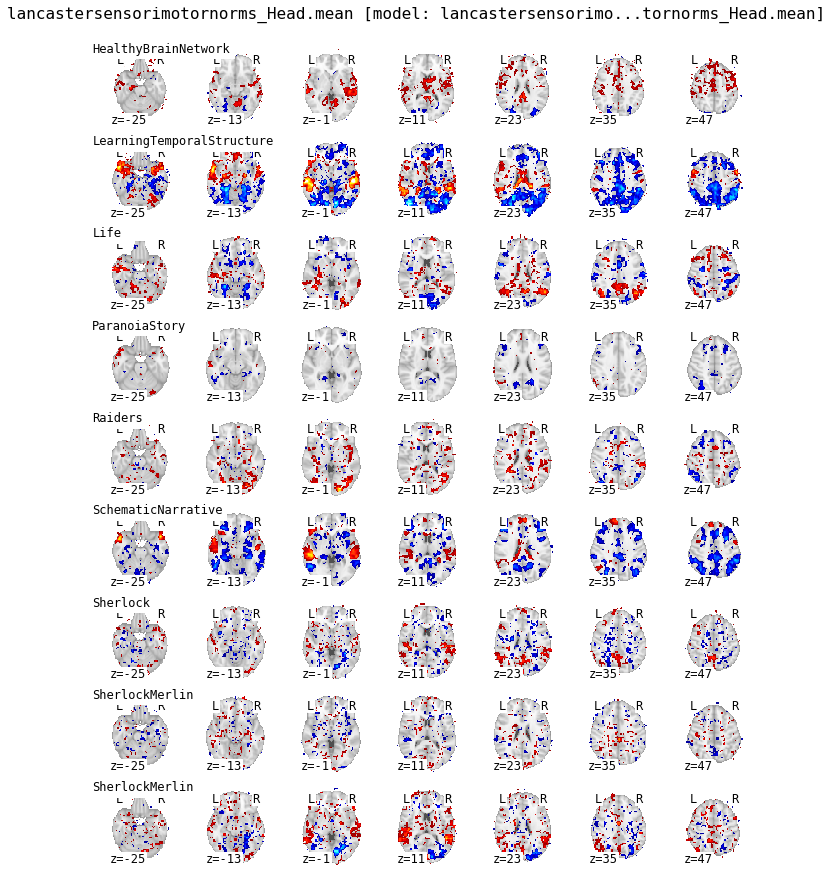

In [31]:
plt.rcParams.update({'font.family': 'monospace'})
plot_contrast_by_analysis(flat_models, contrasts=predictors,
                          vmax=10, display_mode='z', figsize=(12,15),
                          threshold=1.96, colorbar=False)